# Build Week 2

## Because the data is so large, it cannot be hosted on GitHub. Therefore, it will be necessary to download the data directly from [Kaggle](https://www.kaggle.com/junyiacademy/learning-activity-public-dataset-by-junyi-academy).

In [1]:
# import os

# print(os.getcwd())
# print(os.listdir(os.getcwd()))

### The code above is for personal reference only. The cell below was copied from [here](https://stackoverflow.com/questions/22258491/read-a-small-random-sample-from-a-big-csv-file-into-a-python-data-frame) because I needed a 5% sample of over 16 million observations.

**Hypothesis: the more time and effort a student puts into learning a subject, the more successful they are in doing so.**

In [2]:
import pandas as pd
import random

file = "Log_Problem.csv"
n = sum(1 for line in open(file)) - 1
s = 810866
skip = sorted(random.sample(range(1,n+1),n-s))
df = pd.read_csv(file, skiprows=skip)

In [3]:
df.shape

(810866, 14)

In [4]:
user = pd.read_csv("Info_UserData.csv")

user.shape

(72758, 12)

In [5]:
con = pd.read_csv("Info_Content.csv")

con.shape

(1330, 10)

In [6]:
user_log = pd.merge(df, user, on='uuid', how='inner', validate="m:1")

user_log.shape

(810866, 25)

In [7]:
full_sample = pd.merge(user_log, con, on="ucid", how="inner", validate="m:1")

full_sample.shape

(810866, 34)

### Considerations to be answered within:

- ( ) ```Choose which observations you will use to train, validate, and test your model.```
- ( ) ```How is your target distributed?```
- ( ) ```Choose your evaluation metric(s).```
- ( ) ```Choose your target. Which column in your tabular dataset will you predict?```

**There appear to be no outliers with the exception of `NaN` values, which will be changed to 0s or imputed using `SimpleImputer`. The data will be split, with my test data coming from the entirety of 2018. Validation data and testing data are split in the year 2019.**

**My baseline appears to be about 70% `True` and 30% `False`. Because there is an approximate 70/30 split, I am using `accuracy` as my evaluation metric.**

**After exploring the data, it appears the column `"is_correct"` is my target. There are 3-4 features with significant weight in this model: `"total_attempt_cnt"` (the number of attempts the student made), `"used_hint_cnt"` (the number of hints used), `"is_downgrade"` (setbacks in the learning process).**

In [8]:
full_sample["is_correct"].value_counts(normalize=True)

True     0.70434
False    0.29566
Name: is_correct, dtype: float64

In [9]:
full_sample["timestamp_TW"] = pd.to_datetime(full_sample["timestamp_TW"], infer_datetime_format=True)

train = full_sample[full_sample["timestamp_TW"] < "2019-01-01 00:00:00"]

train.shape

(359691, 34)

In [10]:
val = full_sample[(full_sample["timestamp_TW"] >= "2019-01-01 00:00:00") & 
                  (full_sample["timestamp_TW"] < "2019-05-01 00:00:00")]

val.shape

(244866, 34)

In [11]:
test = full_sample[full_sample["timestamp_TW"] >= "2019-05-01 00:00:00"]

test.shape

(206309, 34)

### ```Begin to clean and explore your data.```

#### Below is my data exploration.

In [12]:
from pandas_profiling import ProfileReport

profile = ProfileReport(train, explorative=True).to_notebook_iframe()
profile

In [13]:
print(train.shape)
train.head()

(359691, 34)


,timestamp_TW,uuid,ucid,upid,problem_number,exercise_problem_repeat_session,is_correct,total_sec_taken,total_attempt_cnt,used_hint_cnt,...,has_class_cnt,content_pretty_name,content_kind,difficulty,subject,learning_stage,level1_id,level2_id,level3_id,level4_id
14,2018-12-29 11:15:00,fAr2gi0U/eP+q8XYwNYTcpuI3ocCTx1+aGvC0uzqhOY=,kaswy5Iwfp5d3/3ST/V5AU2yqxKhaFF+OP11w7VeMK4=,Pn5t/P345sIgB5ZXTJZPJFxM6b5D3xEnABSVwow8bO8=,2,1,True,51,1,0,...,0,【基礎】利用全部的比例是 1 來解題,Exercise,easy,math,elementary,aH0Dz0KdH9gio7rrcGRHvrmd9vcd/0WJbeEFB7qeUKA=,7f73q332BKPBXaixasa4EkUb+pF6VAsLxNIg4506JJs=,YM8uggtD5HZBGCCzNJLU90fC9C+B8/bZP3x483rb7PI=,0J0tnqqN7IV7P108aeJCQRw1+X4UKcrkyLOD6za/uJQ=
32,2018-11-13 16:15:00,K3QRRuK4vesSBxyFo3EpU3ccM5Dmh7RjqmQWhMhAHwU=,kaswy5Iwfp5d3/3ST/V5AU2yqxKhaFF+OP11w7VeMK4=,qBWp8fOgAkB1t0VPQAEgJpPV1lK5Q5voZUc1Gs07Qyw=,8,1,False,41,5,2,...,0,【基礎】利用全部的比例是 1 來解題,Exercise,easy,math,elementary,aH0Dz0KdH9gio7rrcGRHvrmd9vcd/0WJbeEFB7qeUKA=,7f73q332BKPBXaixasa4EkUb+pF6VAsLxNIg4506JJs=,YM8uggtD5HZBGCCzNJLU90fC9C+B8/bZP3x483rb7PI=,0J0tnqqN7IV7P108aeJCQRw1+X4UKcrkyLOD6za/uJQ=
33,2018-11-13 16:00:00,K3QRRuK4vesSBxyFo3EpU3ccM5Dmh7RjqmQWhMhAHwU=,kaswy5Iwfp5d3/3ST/V5AU2yqxKhaFF+OP11w7VeMK4=,F1vMpSRn3HaO4Fa2IBwuQh3DCobyzr0e1y0ah230bVs=,2,1,False,9,1,2,...,0,【基礎】利用全部的比例是 1 來解題,Exercise,easy,math,elementary,aH0Dz0KdH9gio7rrcGRHvrmd9vcd/0WJbeEFB7qeUKA=,7f73q332BKPBXaixasa4EkUb+pF6VAsLxNIg4506JJs=,YM8uggtD5HZBGCCzNJLU90fC9C+B8/bZP3x483rb7PI=,0J0tnqqN7IV7P108aeJCQRw1+X4UKcrkyLOD6za/uJQ=
104,2018-12-13 13:15:00,SG345OYvFW7pQFnWqTPuO1LWxk1gT7ofJybRzaFRyYM=,kaswy5Iwfp5d3/3ST/V5AU2yqxKhaFF+OP11w7VeMK4=,F7ScM9YJQyVzUsJsYbTzm0v3cZwutbrNdX41gMI5JmI=,1,1,True,37,1,0,...,0,【基礎】利用全部的比例是 1 來解題,Exercise,easy,math,elementary,aH0Dz0KdH9gio7rrcGRHvrmd9vcd/0WJbeEFB7qeUKA=,7f73q332BKPBXaixasa4EkUb+pF6VAsLxNIg4506JJs=,YM8uggtD5HZBGCCzNJLU90fC9C+B8/bZP3x483rb7PI=,0J0tnqqN7IV7P108aeJCQRw1+X4UKcrkyLOD6za/uJQ=
218,2018-12-28 15:30:00,RLlMB2avBA+NIM9mKnJdcHpm6yKWQM+OJ75JjQ0SWbg=,kaswy5Iwfp5d3/3ST/V5AU2yqxKhaFF+OP11w7VeMK4=,F1vMpSRn3HaO4Fa2IBwuQh3DCobyzr0e1y0ah230bVs=,8,1,True,8,1,0,...,1,【基礎】利用全部的比例是 1 來解題,Exercise,easy,math,elementary,aH0Dz0KdH9gio7rrcGRHvrmd9vcd/0WJbeEFB7qeUKA=,7f73q332BKPBXaixasa4EkUb+pF6VAsLxNIg4506JJs=,YM8uggtD5HZBGCCzNJLU90fC9C+B8/bZP3x483rb7PI=,0J0tnqqN7IV7P108aeJCQRw1+X4UKcrkyLOD6za/uJQ=


### Considerations:

- ( ) ```Begin to clean and explore your data.```
- ( ) ```Begin to choose which features, if any, to exclude. Would some features "leak" future information?```
- ( ) ```Why and how the target was chosen.```
- ( ) ```How was leakage avoided?```

**Below is my wrangling function. For the original model, 14 features will be dropped due to being ID names, or variables with high cardinality and little value.**

**My target was chosen because it seems to support the hypothesis. Within this model, there were quite a number of highly-correlated features; most of them had little value. However, `"is_hint_used"` and `"used_hint_cnt"` have significant weight within the model. They are the leakiest when combined, so `"is_hint_used"` was dropped.**

In [14]:
import numpy as np

# This code is written to rule out high-cardinality features and find a baseline for truly valuable features using
# permutation_importance in the cells below. Also removing `is_hint_used` due to data leakage and correlation to
# `used_hint_cnt`. This is an experiment to see how my model is affected.

def wrangle_hi_card(X):
    
    X = X.copy()
    
    X = X.replace({False : 0, True : 1})
    
    nan_cols = ["is_upgrade", "is_downgrade"]
    for col in nan_cols:
        X[col] = X[col].replace(np.nan, 0)
    
    X = X.drop(["content_kind", "subject", "level1_id", "level2_id", "level3_id",
               "level4_id", "uuid", "ucid", "upid", "timestamp_TW", "is_hint_used",
                "content_pretty_name", "first_login_date_TW"], axis=1)
    
    return X

train1 = wrangle_hi_card(train)
val1 = wrangle_hi_card(val)
test1 = wrangle_hi_card(test)

In [15]:
def wrangle(X):
    
    X = X.copy()
    
    X = X.replace({False : 0, True : 1})
    
    nan_cols = ["is_downgrade"]
    for col in nan_cols:
        X[col] = X[col].replace(np.nan, 0)
        
# This chunk of code is derived from the permutation_importance done below. There are approximately 3-4 valuable features
# in this DF, so all but those few will be dropped.
    
    star_features = ["total_attempt_cnt", "used_hint_cnt", "badges_cnt",
                     "points", "is_downgrade", "is_correct"]
    X = X[star_features]
    
    return X

train2 = wrangle(train)
val2 = wrangle(val)
test2 = wrangle(test)

target = "is_correct"

X_train2 = train2.drop([target], axis=1)
y_train2 = train2[target]
X_val2 = val2.drop([target], axis=1)
y_val2 = val2[target]
X_test2 = test2.drop([target], axis=1)

### ```Is your problem regression or classification?```

#### Being that my target only has binary options, this will be a `classification model`.

In [16]:
target = "is_correct"

X_train1 = train1.drop([target], axis=1)
y_train1 = train1[target]
X_val1 = val1.drop([target], axis=1)
y_val1 = val1[target]
X_test1 = test1.drop([target], axis=1)

### Data sets 1 and 2 diverge in very big ways: the features in `data set 2` have the most prominent effect on the original data. The work below shows the effectiveness of such tactics.

In [17]:
print(X_train1.shape)
X_train1.head()

(359691, 20)


,problem_number,exercise_problem_repeat_session,total_sec_taken,total_attempt_cnt,used_hint_cnt,is_downgrade,is_upgrade,level,gender,points,badges_cnt,user_grade,user_city,has_teacher_cnt,is_self_coach,has_student_cnt,belongs_to_class_cnt,has_class_cnt,difficulty,learning_stage
14,2,1,51,1,0,0.0,0.0,0,male,527379,47,7,ntpc,1,0,0,3,0,easy,elementary
32,8,1,41,5,2,0.0,0.0,0,female,253450,139,6,ty,1,0,0,0,0,easy,elementary
33,2,1,9,1,2,0.0,0.0,0,female,253450,139,6,ty,1,0,0,0,0,easy,elementary
104,1,1,37,1,0,0.0,0.0,0,unspecified,531475,19,6,tc,2,0,0,2,0,easy,elementary
218,8,1,8,1,0,0.0,1.0,2,male,425205,54,6,tp,1,0,0,1,1,easy,elementary


In [18]:
print(X_train2.shape)
X_train2.head()

(359691, 5)


,total_attempt_cnt,used_hint_cnt,badges_cnt,points,is_downgrade
14,1,0,47,527379,0.0
32,5,2,139,253450,0.0
33,1,2,139,253450,0.0
104,1,0,19,531475,0.0
218,1,0,54,425205,0.0


In [19]:
import category_encoders as ce
from sklearn.pipeline import make_pipeline
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier

pipeline1 = make_pipeline(
    ce.TargetEncoder(),
    XGBClassifier(random_state=39)
)

In [20]:
pipeline1.fit(X_train1, y_train1);

In [21]:
print("Training Accuracy:", pipeline1.score(X_train1, y_train1))
print("Validation Accuracy:", pipeline1.score(X_val1, y_val1))

Training Accuracy 0.9981762123600535
Validation Accuracy 0.995303553780435


In [22]:
from sklearn.metrics import classification_report

y_pred1 = pipeline1.predict(X_val1)
print(classification_report(y_val1, y_pred1))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99     76880
           1       0.99      1.00      1.00    167986

    accuracy                           1.00    244866
   macro avg       1.00      0.99      0.99    244866
weighted avg       1.00      1.00      1.00    244866



In [23]:
from sklearn.metrics import roc_auc_score

y_pred_prob1 = pipeline1.predict_proba(X_val1)[:, -1]

print("Pipeline ROC-AUC Score:", roc_auc_score(y_val1, y_pred_prob1))

Pipeline ROC-AUC Score: 0.9954280814606435


In [24]:
pipeline2 = make_pipeline(
    ce.OrdinalEncoder(),
    XGBClassifier(random_state=39)
)

In [25]:
pipeline2.fit(X_train2, y_train2);

print("Training Accuracy:", pipeline2.score(X_train2, y_train2))
print("Validation Accuracy:", pipeline2.score(X_val2, y_val2))

Training Accuracy 0.9981789925241388
Validation Accuracy 0.9953198892455466


In [26]:
y_pred2 = pipeline2.predict(X_val2)
print(classification_report(y_val2, y_pred2))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99     76880
           1       0.99      1.00      1.00    167986

    accuracy                           1.00    244866
   macro avg       1.00      0.99      0.99    244866
weighted avg       1.00      1.00      1.00    244866



In [27]:
y_pred_prob2 = pipeline2.predict_proba(X_val2)[:, -1]

print('Pipeline ROC-AUC Score:', roc_auc_score(y_val2, y_pred_prob2))

Pipeline ROC-AUC Score: 0.9935986370290285


**My quick-and-dirty model (with bagging) gives me a 99.5% validation accuracy. The cells below are experimenting with permutation importance (i.e. Seeing which features affect my model the most). My ROC-AUC score also provides good evidence that this model will predict accurately (99.38%).**
**Alternatively, boosting the model gives me a validation accuracy of 99.5% and an ROC-AUC score of 99.53%. Boosting the model has shown a marginal improvement in performance.**

**The above observations were made with two highly-correlated features in the data, which may have caused data leakage. That being said, dropping one said feature has not seemed to affect the predictive model very much.**

In [28]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier


morty = make_pipeline(
    ce.OrdinalEncoder(),
    SimpleImputer(),
    StandardScaler(),
    RandomForestClassifier(n_estimators=75, n_jobs=1, random_state=45)
)

beth = {
    "simpleimputer__strategy" : ("mean", "median", "most_frequent"),
    "randomforestclassifier__criterion" : ("gini", "entropy"),
    "randomforestclassifier__max_depth" : (25, 50, 75),
    "randomforestclassifier__min_samples_split" : (25, 30, 35),
    "randomforestclassifier__max_features" : (2, 3, 5),
}

rick = RandomizedSearchCV(
    morty,
    param_distributions=beth,
    n_iter=54,
    scoring="accuracy",
    n_jobs=4,
    cv=5,
    verbose=1,
    random_state=45,
    return_train_score=True
)

rick.fit(X_train2, y_train2);

print("Best Score:", rick.best_score_)
print("Best Model:", rick.best_params_)
print("Current Model:", rick.best_estimator_)

Fitting 5 folds for each of 54 candidates, totalling 270 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed: 21.0min
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed: 90.0min
[Parallel(n_jobs=4)]: Done 270 out of 270 | elapsed: 126.2min finished


Best Score: 0.9981623133095681
Best Model: {'simpleimputer__strategy': 'most_frequent', 'randomforestclassifier__min_samples_split': 25, 'randomforestclassifier__max_features': 5, 'randomforestclassifier__max_depth': 25, 'randomforestclassifier__criterion': 'entropy'}
Current Model: Pipeline(steps=[('ordinalencoder', OrdinalEncoder(cols=[], mapping=[])),
                ('simpleimputer', SimpleImputer(strategy='most_frequent')),
                ('standardscaler', StandardScaler()),
                ('randomforestclassifier',
                 RandomForestClassifier(criterion='entropy', max_depth=25,
                                        max_features=5, min_samples_split=25,
                                        n_estimators=75, n_jobs=1,
                                        random_state=45))])


In [29]:
print("Training Accuracy:", rick.score(X_train2, y_train2))
print("Validation Accuracy:", rick.score(X_val2, y_val2))

Training Accuracy: 0.9981901131804799
Validation Accuracy: 0.9953198892455466


In [ ]:
# print("Testing Results:", rick.score(X_test2, y_test2))

In [30]:
y_p_p = rick.predict_proba(X_val2)[:, -1]

print('Pipeline ROC-AUC Score:', roc_auc_score(y_val2, y_p_p))

Pipeline ROC-AUC Score: 0.9928431252564739


## Below is my linear model. It doesn't do any better than the baseline, therefore, it is a rejected model.

In [31]:
from sklearn.linear_model import LogisticRegression

pickle_rick = make_pipeline(
    ce.TargetEncoder(),
    LogisticRegression(random_state=75)
)

pickle_rick.fit(X_train2, y_train2)

print("Training Accuracy:", pickle_rick.score(X_train2, y_train2))
print("Validation Accuracy:", pickle_rick.score(X_val2, y_val2))

Training Accuracy: 0.7207825605867259
Validation Accuracy: 0.686032360556386


### The visualizations for my models with corresponding tables:

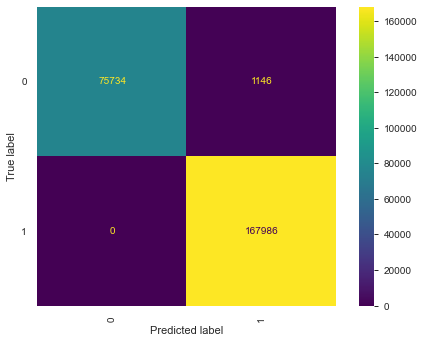

In [32]:
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(pipeline2, X_val2, y_val2,
                      values_format='.0f', xticks_rotation='vertical');

In [33]:
from sklearn.inspection import permutation_importance

big_whammy = permutation_importance(pipeline1, X_val1, y_val1, 
                                    n_repeats=13, random_state=39)

In [34]:
whats_it = pd.DataFrame({"feature": X_val1.columns,
                         "importances_mean": np.round(big_whammy["importances_mean"], 3),
                         "importances_std": np.round(big_whammy["importances_std"], 5)})

whats_it.sort_values(by="importances_mean", ascending=False)

,feature,importances_mean,importances_std
3,total_attempt_cnt,0.240,0.00040
4,used_hint_cnt,0.191,0.00049
5,is_downgrade,0.001,0.00005
0,problem_number,0.000,0.00000
12,user_city,-0.000,0.00000
18,difficulty,-0.000,0.00000
17,has_class_cnt,0.000,0.00000
16,belongs_to_class_cnt,0.000,0.00000
15,has_student_cnt,0.000,0.00000
14,is_self_coach,0.000,0.00000


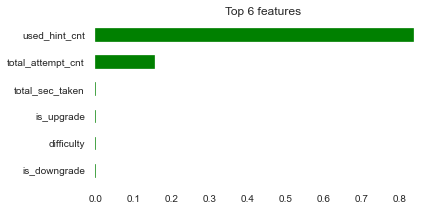

In [35]:
%matplotlib inline
import matplotlib.pyplot as plt

search_feature = pipeline1.named_steps["xgbclassifier"]
importances = pd.Series(search_feature.feature_importances_, X_train1.columns)

n = 6
plt.figure(figsize=(6,n/2))
plt.title(f"Top {n} features")
importances.sort_values()[-n:].plot.barh(color="green");

In [36]:
from sklearn.metrics import roc_curve

fpr1, tpr1, thresholds1 = roc_curve(y_val1, y_pred_prob1)

voila1 = pd.DataFrame({"False Positive Rate": fpr1,
                      "True Positive Rate": tpr1,
                      "Threshold": np.round(thresholds1, 2)})

voila1

,False Positive Rate,True Positive Rate,Threshold
0,0.000000,0.000000,2.0
1,0.000000,0.000214,1.0
2,0.000000,0.000571,1.0
3,0.000000,0.000595,1.0
4,0.000000,0.000708,1.0
...,...,...,...
7126,0.999727,1.000000,0.0
7127,0.999883,1.000000,0.0
7128,0.999909,1.000000,0.0
7129,0.999974,1.000000,0.0


Text(0, 0.5, 'True Positive Rate')

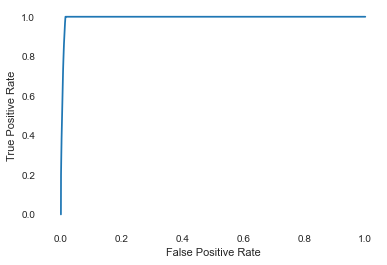

In [37]:
plt.plot(fpr1, tpr1)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")

In [38]:
fpr2, tpr2, thresholds2 = roc_curve(y_val2, y_pred_prob2)

voila2 = pd.DataFrame({"False Positive Rate": fpr2,
                      "True Positive Rate": tpr2,
                      "Threshold": thresholds2})

voila2

,False Positive Rate,True Positive Rate,Threshold
0,0.000000,0.000000,1.998960
1,0.000000,0.003149,0.998960
2,0.000091,0.006602,0.998908
3,0.000091,0.007096,0.998858
4,0.000104,0.009388,0.998845
...,...,...,...
186,0.453447,1.000000,0.000066
187,0.453460,1.000000,0.000063
188,0.454592,1.000000,0.000062
189,0.454605,1.000000,0.000057


Text(0, 0.5, 'True Positive Rate')

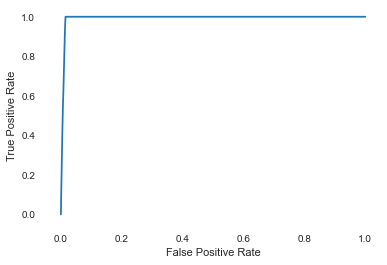

In [39]:
plt.plot(fpr2, tpr2)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")

In [40]:
fpr3, tpr3, thresholds3 = roc_curve(y_val2, y_p_p)

voila3 = pd.DataFrame({"False Positive Rate": fpr3,
                      "True Positive Rate": tpr3,
                      "Threshold": thresholds3})

voila3

,False Positive Rate,True Positive Rate,Threshold
0,0.000000,0.000000,2.000000
1,0.000351,0.024966,1.000000
2,0.000351,0.024990,0.999992
3,0.000364,0.025175,0.999980
4,0.000468,0.025347,0.999973
...,...,...,...
7353,0.014906,0.999952,0.666425
7354,0.014906,0.999958,0.626541
7355,0.014906,0.999994,0.588672
7356,0.014906,1.000000,0.517527


Text(0, 0.5, 'True Positive Rate')

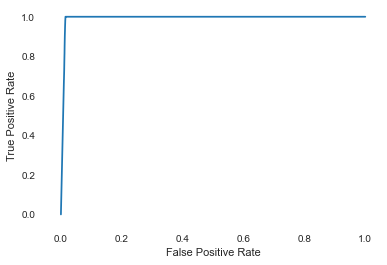

In [41]:
plt.plot(fpr3, tpr3)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")

## Rejected code:

In [42]:
# from sklearn.ensemble import GradientBoostingClassifier

# box = make_pipeline(
#     ce.OrdinalEncoder(),
#     SimpleImputer(),
#     StandardScaler(),
#     GradientBoostingClassifier(n_estimators=15, random_state=45)
# )

# pars = {
#     "simpleimputer__strategy" : ("mean", "median", "most_frequent"),
#     "gradientboostingclassifier__loss" : ("deviance", "exponential"),
#     "gradientboostingclassifier__criterion" : ("friedman_mse", "mse", "mae"),
#     "gradientboostingclassifier__min_samples_split" : (2, 5, 7),
#     "gradientboostingclassifier__max_depth" : (3, 5, 8),
#     "gradientboostingclassifier__max_features" : ("auto", "sqrt", "log2")
# }

# meseeks = RandomizedSearchCV(
#     box,
#     param_distributions=pars,
#     n_iter=54,
#     scoring="accuracy",
#     n_jobs=4,
#     cv=3,
#     verbose=10,
#     random_state=45,
#     return_train_score=True
# )

# meseeks.fit(X_train1, y_train1);

# print("Best Score:", meseeks.best_score_)
# print("Best Model:", meseeks.best_params_)
# print("Current Model:", meseeks.best_estimator_)

In [43]:
# print("Training Accuracy:", meseeks.score(X_train1, y_train1))
# print("Validation Accuracy:", meseeks.score(X_val1, y_val1))

In [44]:
# y_predict_prob = meseeks.predict_proba(X_val1)[:, -1]

# print('Pipeline ROC-AUC Score:', roc_auc_score(y_val1, y_predict_prob))

In [45]:
# pipeline2 = make_pipeline(
#     ce.OrdinalEncoder(),
#     SimpleImputer(),
#     StandardScaler(),
#     GradientBoostingClassifier(n_estimators=25, random_state=45)
# )

# paras = {
#     "simpleimputer__strategy" : ("mean", "median", "most_frequent"),
#     "gradientboostingclassifier__loss" : ("deviance", "exponential"),
#     "gradientboostingclassifier__criterion" : ("friedman_mse", "mse", "mae"),
#     "gradientboostingclassifier__min_samples_split" : (2, 5, 7),
#     "gradientboostingclassifier__max_depth" : (3, 5, 8),
#     "gradientboostingclassifier__max_features" : ("auto", "sqrt", "log2")

# }

# meseeks2 = RandomizedSearchCV(
#     pipeline2,
#     param_distributions=paras,
#     n_iter=54,
#     scoring="accuracy",
#     n_jobs=4,
#     cv=5,
#     verbose=1,
#     random_state=45,
#     return_train_score=True
# )

# meseeks2.fit(X_train2, y_train2);

# print("Best Score:", meseeks2.best_score_)
# print("Best Model:", meseeks2.best_params_)
# print("Current Model:", meseeks2.best_estimator_)

In [46]:
# print("Training Accuracy:", meseeks2.score(X_train2, y_train2))
# print("Validation Accuracy:", meseeks2.score(X_val2, y_val2))

In [47]:
# y_pred_proba = meseeks2.predict_proba(X_val2)[:, -1]

# print('Pipeline ROC-AUC Score:', roc_auc_score(y_val2, y_pred_proba))